In [ ]:
!wget "https://data.4tu.nl/file/6f35269e-4ce7-4bc4-9abb-b3cea04cad00/2c8d5827-3e08-471d-98e2-6ffdec92f958" -O "BPIC15_1.xes"
!wget "https://data.4tu.nl/file/372d0cad-3fb1-4627-8ea9-51a09923d331/d653a8ec-4cd1-4029-8b61-6cfde4f4a666" -O "BPIC15_2.xes"
!wget "https://data.4tu.nl/file/d6741425-5f62-4a59-92c5-08bae64b4611/21b574ab-02ba-4dfb-badc-bb46ce0edc44" -O "BPIC15_3.xes"
!wget "https://data.4tu.nl/file/34216d8a-f054-46d4-bf03-d9352f90967e/68923819-b085-43be-abe2-e084a0f1381f" -O "BPIC15_4.xes"
!wget "https://data.4tu.nl/file/32b70553-0765-4808-b155-aa5319802c8a/d39e1365-e4b8-4cb8-83d3-0b01cbf6f8c2" -O "BPIC15_5.xes"

--2023-05-11 09:02:36--  https://data.4tu.nl/file/6f35269e-4ce7-4bc4-9abb-b3cea04cad00/2c8d5827-3e08-471d-98e2-6ffdec92f958
Resolving data.4tu.nl (data.4tu.nl)... 131.180.169.22
Connecting to data.4tu.nl (data.4tu.nl)|131.180.169.22|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 41227060 (39M) [application/octet-stream]
Saving to: ‘BPIC15_1.xes’

BPIC15_1.xes        100%[===================>]  39.32M  11.8MB/s    in 3.3s    

2023-05-11 09:02:42 (11.8 MB/s) - ‘BPIC15_1.xes’ saved [41227060/41227060]

--2023-05-11 09:02:42--  https://data.4tu.nl/file/372d0cad-3fb1-4627-8ea9-51a09923d331/d653a8ec-4cd1-4029-8b61-6cfde4f4a666
Resolving data.4tu.nl (data.4tu.nl)... 131.180.169.22
Connecting to data.4tu.nl (data.4tu.nl)|131.180.169.22|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 34423078 (33M) [application/octet-stream]
Saving to: ‘BPIC15_2.xes’

BPIC15_2.xes        100%[===================>]  32.83M  12.4MB/s    in 2.6s    

2023-05-11

In [ ]:
!pip install pm4py

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 30.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
  Created wheel for intervaltree: filename=intervaltree-3.1.0-py2.py3-none-any.whl size=26099 sha256=c04033d688ac7d5b52bd1550be5610461f6999cc9a7f55ed68be8d9b3cc08ec9
  Stored in directory: /root/.cache/pip/wheels/fa/80/8c/43488a924a046b733b64de3fac99252674c892a4c3801c0a61
  Created wheel for stringdist: filename=StringDist-1.0.9-cp310-cp310-linux_x86_64.whl size=24936 sha256=a7eb31cebae10cbb8a51820bb1c71e805196e5aa4d6c904a0fb21dace105227d
  Stored in directory: /root/.cache/pip/wheels/79/25/0a/4a0c2c7af31a8b473f6e10e30312396f31ae899722600d7b99
Successfully built intervaltree stringdist


In [ ]:
import pm4py
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from pm4py.objects.conversion.log import converter as log_converter
from pm4py.algo.filtering.log.attributes import attributes_filter

In [60]:
log1 = pm4py.read_xes('BPIC15_1.xes')
log2 = pm4py.read_xes('BPIC15_2.xes')
log3 = pm4py.read_xes('BPIC15_3.xes')
log4 = pm4py.read_xes('BPIC15_4.xes')
log5 = pm4py.read_xes('BPIC15_5.xes')

parsing log, completed traces ::   0%|          | 0/1199 [00:00<?, ?it/s]

parsing log, completed traces ::   0%|          | 0/832 [00:00<?, ?it/s]

parsing log, completed traces ::   0%|          | 0/1409 [00:00<?, ?it/s]

parsing log, completed traces ::   0%|          | 0/1053 [00:00<?, ?it/s]

parsing log, completed traces ::   0%|          | 0/1156 [00:00<?, ?it/s]

In [61]:
log1['muni'] = 'A'
log2['muni'] = 'B'
log3['muni'] = 'C'
log4['muni'] = 'D'
log5['muni'] = 'E'
log = pd.concat((log1, log2, log3, log4, log5))

In [62]:
case_starts_ends = log.pivot_table(index='case:concept:name', aggfunc={'time:timestamp': ['min', 'max']}) 
case_starts_ends = case_starts_ends.reset_index()
case_starts_ends.columns = ['case:concept:name', 'caseend', 'casestart']
log = log.merge(case_starts_ends, on='case:concept:name')
log['relativetime'] = log['time:timestamp'] - log['casestart']
log['relativetime_s'] = log['relativetime'].dt.seconds + 86400*log['relativetime'].dt.days 
log['relativedays'] = log['relativetime'].dt.days
log['caselength'] = log['caseend'] - log['casestart']
log

,question,dateFinished,dueDate,action_code,activityNameEN,planned,time:timestamp,monitoringResource,org:resource,activityNameNL,...,case:caseProcedure,case:Includes_subCases,dateStop,muni,caseend,casestart,relativetime,relativetime_s,relativedays,caselength
0,EMPTY,2014-04-14 00:00:00+00:00,2014-04-17 07:30:39+00:00,01_HOOFD_010,register submission date request,2014-04-15 07:30:39+00:00,2014-04-10 22:00:00+00:00,2670601,9264148,registratie datum binnenkomst aanvraag,...,NaN,NaN,NaT,A,2014-06-04 22:00:00+00:00,2014-04-10 22:00:00+00:00,0 days 00:00:00,0,0,55 days 00:00:00
1,False,2014-04-14 00:00:00+00:00,NaT,01_HOOFD_011,OLO messaging active,2014-04-15 07:34:03+00:00,2014-04-13 22:00:00+00:00,2670601,9264148,OLO berichtenverkeer actief,...,NaN,NaN,NaT,A,2014-06-04 22:00:00+00:00,2014-04-10 22:00:00+00:00,3 days 00:00:00,259200,3,55 days 00:00:00
2,True,2014-04-14 00:00:00+00:00,NaT,01_HOOFD_020,send confirmation receipt,2014-04-15 07:34:03+00:00,2014-04-13 22:00:00+00:00,2670601,9264148,versturen ontvangstbevestiging,...,NaN,NaN,NaT,A,2014-06-04 22:00:00+00:00,2014-04-10 22:00:00+00:00,3 days 00:00:00,259200,3,55 days 00:00:00
3,False,2014-04-14 00:00:00+00:00,2014-04-21 07:37:17+00:00,02_DRZ_010,forward to the competent authority,2014-04-15 07:37:17+00:00,2014-04-13 22:00:00+00:00,2670601,9264148,doorsturen aan bevoegd gezag,...,NaN,NaN,NaT,A,2014-06-04 22:00:00+00:00,2014-04-10 22:00:00+00:00,3 days 00:00:00,259200,3,55 days 00:00:00
4,True,2014-04-14 00:00:00+00:00,NaT,04_BPT_005,regular procedure without MER,2014-04-15 07:37:22+00:00,2014-04-13 22:00:00+00:00,2670601,9264148,reguliere procedure zonder MER,...,NaN,NaN,NaT,A,2014-06-04 22:00:00+00:00,2014-04-10 22:00:00+00:00,3 days 00:00:00,259200,3,55 days 00:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
262623,EMPTY,2014-03-12 00:00:00+00:00,NaT,01_HOOFD_811,stop all running subcases 2b,2014-03-13 13:55:33+00:00,2014-03-11 23:00:00+00:00,560600,560600,stop alle lopende deelzaken 2b,...,NaN,NaN,NaT,E,2014-03-12 13:55:18+00:00,2013-12-29 23:00:00+00:00,72 days 00:00:00,6220800,72,72 days 14:55:18
262624,EMPTY,2014-03-12 00:00:00+00:00,NaT,01_HOOFD_815,phase case handled,2014-03-13 13:55:57+00:00,2014-03-11 23:00:00+00:00,560600,560600,fase zaak afgehandeld,...,NaN,NaN,NaT,E,2014-03-12 13:55:18+00:00,2013-12-29 23:00:00+00:00,72 days 00:00:00,6220800,72,72 days 14:55:18
262625,EMPTY,2014-03-12 00:00:00+00:00,NaT,01_HOOFD_809,read publication date field,2014-03-13 13:55:19+00:00,2014-03-11 23:00:00+00:00,560600,560600,veld datum publicatie uitlezen,...,NaN,NaN,NaT,E,2014-03-12 13:55:18+00:00,2013-12-29 23:00:00+00:00,72 days 00:00:00,6220800,72,72 days 14:55:18
262626,EMPTY,2014-03-12 00:00:00+00:00,NaT,01_BB_775,phase decision irrevocable,2014-03-13 13:55:19+00:00,2014-03-11 23:00:00+00:00,560600,560600,fase besluit onherroepelijk,...,NaN,NaN,NaT,E,2014-03-12 13:55:18+00:00,2013-12-29 23:00:00+00:00,72 days 00:00:00,6220800,72,72 days 14:55:18


In [ ]:
print(f"Число событий: {len(log)}")
print(f"Число кейсов: {len(log['case:concept:name'].unique())}")

Число событий: 262628
Число кейсов: 5647


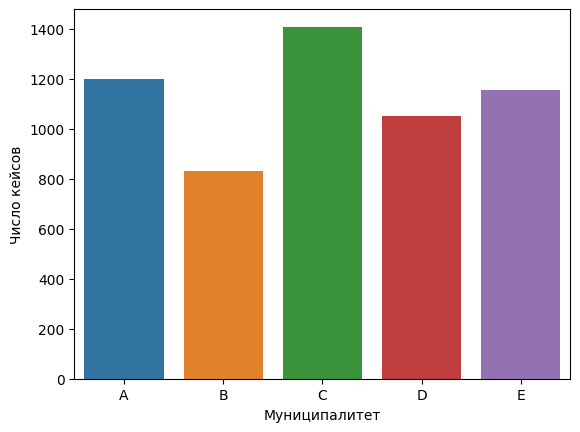

In [ ]:
# Число кейсов по муниципалитетам
bp = log.groupby(['muni'])['case:concept:name'].nunique().reset_index()
sns.barplot(x=bp['muni'], y=bp['case:concept:name'])
plt.xlabel("Муниципалитет")
plt.ylabel("Число кейсов");

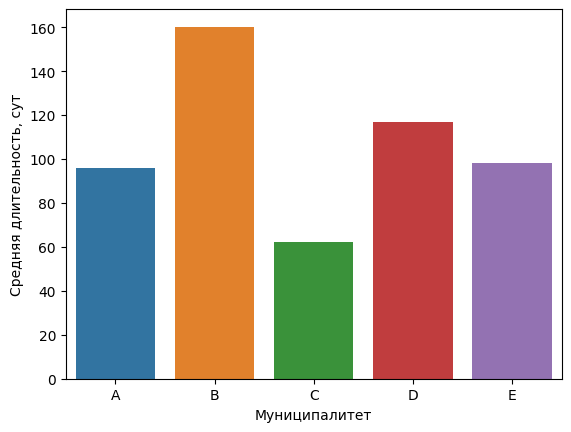

In [ ]:
# Средняя длительность кейсов по муниципалитетам
mean_length = log.groupby(['muni', 'case:concept:name'])['caselength'].mean().groupby('muni').mean().reset_index()
sns.barplot(x=mean_length['muni'], y=mean_length['caselength'].dt.seconds / 86400 + mean_length['caselength'].dt.days)
plt.xlabel("Муниципалитет")
plt.ylabel("Средняя длительность, сут");

In [ ]:
event_log = log_converter.apply(log)

In [ ]:
len(event_log)

5647

In [63]:
# Подсчет событий и десяь самых частых
actions = attributes_filter.get_attribute_values(log, 'concept:name')
sorted(actions.items(), key=lambda i: i[1], reverse=True)[:10]

[('01_HOOFD_010', 5644),
 ('01_HOOFD_015', 5644),
 ('01_HOOFD_020', 5636),
 ('01_HOOFD_180', 5413),
 ('01_HOOFD_200', 4869),
 ('09_AH_I_010', 4744),
 ('01_HOOFD_380', 4739),
 ('01_HOOFD_375', 4730),
 ('01_HOOFD_490_1', 4625),
 ('01_HOOFD_510_2', 4492)]

In [64]:
# Подсчет ресурсов и десяь самых частых
resources = attributes_filter.get_attribute_values(log, 'org:resource')
sorted(resources.items(), key=lambda i: i[1], reverse=True)[:10]

[('560781', 15748),
 ('560454', 14620),
 ('560752', 13624),
 ('560604', 12225),
 ('560530', 12162),
 ('560872', 12117),
 ('560532', 11397),
 ('560602', 10505),
 ('560673', 10457),
 ('2670601', 9886)]

In [ ]:
from pm4py.algo.filtering.log.variants import variants_filter
from pm4py.statistics.traces.generic.log import case_statistics

variants = variants_filter.get_variants(event_log)
print(f"Различные варианты путей: {len(variants)}")

Различные варианты путей: 5539


In [65]:
# Подсчет вариантов путей
variants_count = case_statistics.get_variant_statistics(log)
variants_count[:4]

[{'variant': ('01_HOOFD_010',
   '01_HOOFD_030_2',
   '01_HOOFD_015',
   '01_HOOFD_020',
   '01_HOOFD_030_1'),
  'count': 18},
 {'variant': ('01_HOOFD_010',
   '01_HOOFD_011',
   '03_GBH_005',
   '01_HOOFD_015',
   '01_HOOFD_020',
   '01_HOOFD_030_1',
   '01_HOOFD_030_2'),
  'count': 15},
 {'variant': ('01_HOOFD_010',
   '01_HOOFD_011',
   '01_HOOFD_020',
   '01_HOOFD_015',
   '01_HOOFD_030_1',
   '01_HOOFD_030_2'),
  'count': 10},
 {'variant': ('01_HOOFD_010',
   '01_HOOFD_030_2',
   '01_HOOFD_015',
   '01_HOOFD_020',
   '01_HOOFD_030_1',
   '01_HOOFD_040'),
  'count': 9}]

In [ ]:
min_count = log.groupby("case:concept:name").size().min()
max_count = log.groupby("case:concept:name").size().max()

print(f"Минимальное количество событий: {min_count}, максимальное: {max_count}")

Минимальное количество событий: 1, максимальное: 154


In [ ]:
# Есть ли общие события
set.intersection(*[set(x['variant']) for x in variants_count])

set()

In [ ]:
# Самый частый путь событий
max(variants_count, key=lambda x: x['count'])

{'variant': ('01_HOOFD_010',
  '01_HOOFD_030_2',
  '01_HOOFD_015',
  '01_HOOFD_020',
  '01_HOOFD_030_1'),
 'count': 18}

In [ ]:
# Кейсы, занимающие меньше и больше всего времени
min_idx = log['caselength'].idxmin()
max_idx = log['caselength'].idxmax()
print(f"Меньше всего времени: {log.loc[min_idx]['case:concept:name']} - {log.loc[min_idx]['caselength']}")
print(f"Больше всего времени: {log.loc[max_idx]['case:concept:name']} - {log.loc[max_idx]['caselength']}")

Меньше всего времени: 21573264 - 0 days 00:00:00
Больше всего времени: 3198296 - 1512 days 00:00:00


In [ ]:
durations = pd.Series(dtype = object)
for case_id in log['case:concept:name'].unique():
  timestamps = log[log['case:concept:name'] == case_id]['time:timestamp']
  dt = (timestamps[1:].reset_index() - timestamps[:-1].reset_index())['time:timestamp']
  durations = pd.concat((durations, dt, pd.Series(pd.NaT)))
log['duration'] = durations.reset_index(drop=True)

print(f"Событие, занимающее в среднем дольше всего: {log.groupby('concept:name')['duration'].mean().idxmax()}")

Событие, занимающее в среднем дольше всего: 01_BB_680


In [ ]:
# Десять самых долгих в среднем событий
log.groupby('concept:name')['duration'].mean().sort_values(ascending=False)[:10]

concept:name
01_BB_680           157 days 02:33:42.400000
07_OPS_030          133 days 03:28:41.200000
01_BB_670           132 days 15:55:06.750000
08_AWB45_051_2      128 days 00:44:16.700000
01_HOOFD_140     100 days 08:19:35.833333333
01_BB_640         83 days 12:41:02.923076923
01_BB_550_3                 83 days 01:00:00
01_BB_635         69 days 15:08:12.222222222
01_HOOFD_080      62 days 20:01:50.411764706
07_OPS_040           60 days 11:34:23.750000
Name: duration, dtype: timedelta64[ns]

In [ ]:
# Для более наглядной визуализации объединим по одинаковым этапам события одного типа (по первой цифре трехзначного кода)
for l in [log, log1, log2, log3, log4, log5]:
  l['concept:name'] = l['concept:name'].map(lambda s: str(s)[:str(s).find('_', 3)+2])

In [ ]:
from pm4py.algo.evaluation.simplicity import algorithm as simplicity_evaluator
from pm4py.algo.evaluation.generalization import algorithm as generalization_evaluator
from pm4py.visualization.petri_net import visualizer as pn_visualizer

replaying log with TBR, completed variants ::   0%|          | 0/1119 [00:00<?, ?it/s]

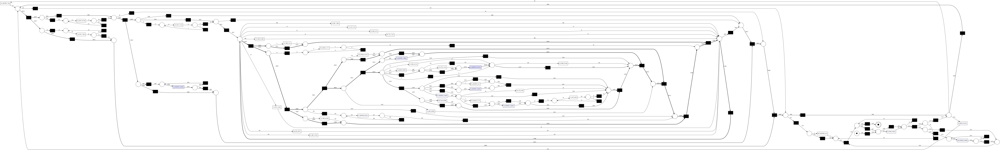

In [ ]:
# Индуктивный майнер и сеть Петри для муниципалитета A
net, im, fm = pm4py.discover_petri_net_inductive(log1)
gviz = pn_visualizer.apply(net, im, fm,
                           parameters={pn_visualizer.Variants.FREQUENCY.value.Parameters.FORMAT: "png"},
                           variant=pn_visualizer.Variants.FREQUENCY,
                           log=log1)
pn_visualizer.view(gviz)

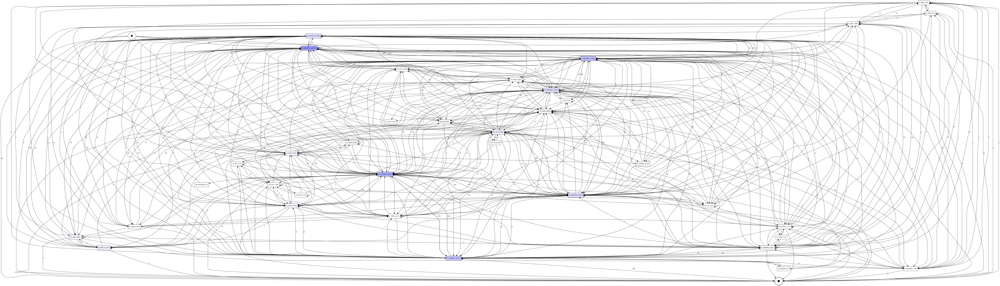

In [ ]:
# DFG-граф для муниципалитета A
dfg, start_activities, end_activities = pm4py.discover_dfg(log1)
pm4py.view_dfg(dfg, start_activities, end_activities)

/usr/local/lib/python3.10/dist-packages/pm4py/algo/discovery/dfg/adapters/pandas/df_statistics.py:73: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[start_timestamp_key] = df[timestamp_key]


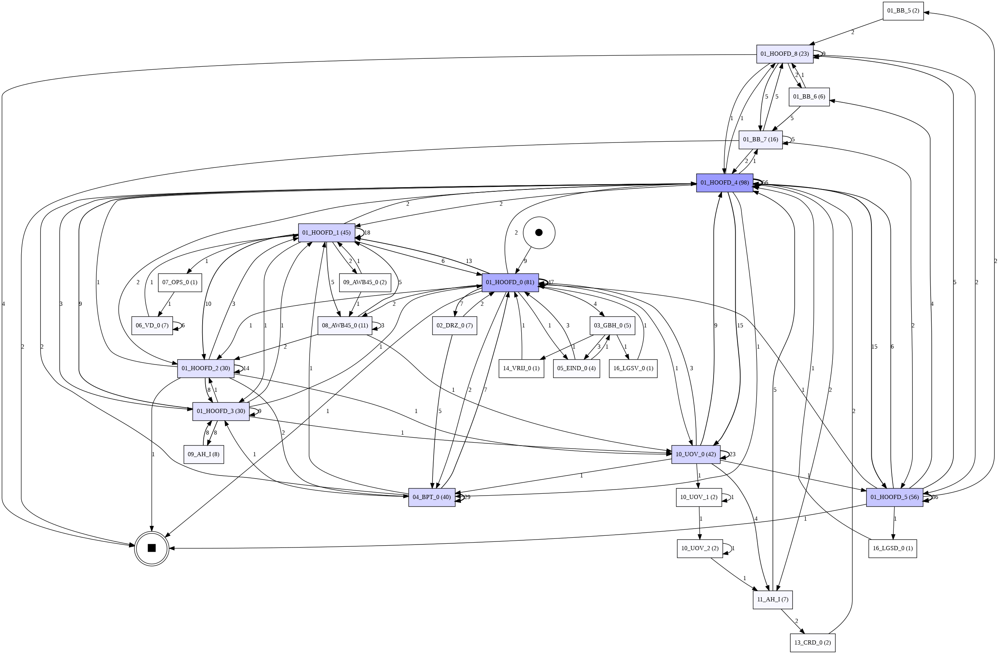

In [ ]:
# События связанные с разрешениями по пожарной безобасности для муниципалитета B
dfg, start_activities, end_activities = pm4py.discover_dfg(log2[log2['case:parts'] == 'Brandveilig gebruik (vergunning)'])
pm4py.view_dfg(dfg, start_activities, end_activities)

/usr/local/lib/python3.10/dist-packages/pm4py/algo/discovery/dfg/adapters/pandas/df_statistics.py:73: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[start_timestamp_key] = df[timestamp_key]


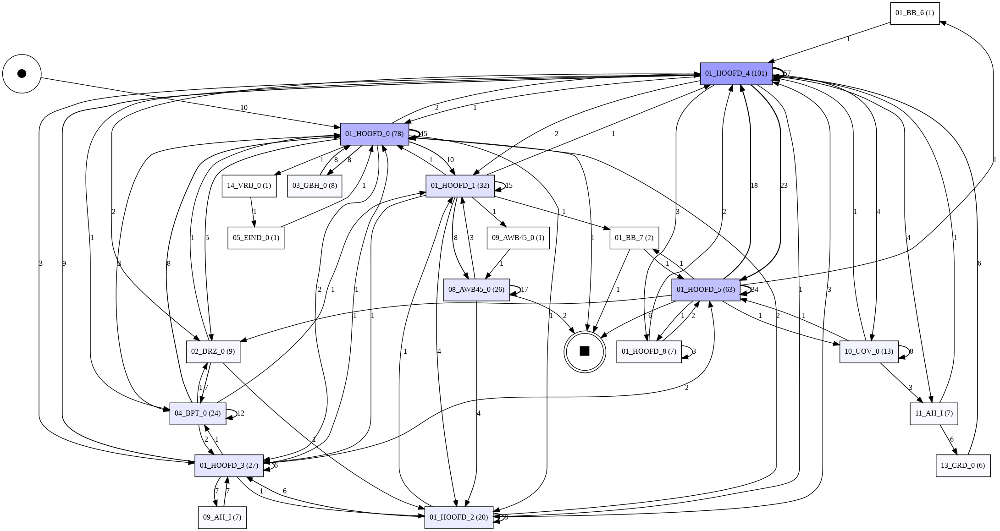

In [ ]:
# События связанные с разрешениями по пожарной безобасности для муниципалитета C
dfg, start_activities, end_activities = pm4py.discover_dfg(log3[log3['case:parts'] == 'Brandveilig gebruik (vergunning)'])
pm4py.view_dfg(dfg, start_activities, end_activities)

In [ ]:
# Количество работников по муниципалитетам
pt = pd.pivot_table(log, index='muni', values=['case:Responsible_actor', 'monitoringResource', 'org:resource'], aggfunc=pd.Series.nunique).T
pt.index = ['responsible', 'monitoring', 'resource']
pt

muni,A,B,C,D,E
responsible,20,7,20,9,8
monitoring,26,9,22,12,16
resource,23,11,14,10,22


In [ ]:
# Наиболее загруженные сотрудники
groupped = log.groupby(['muni', 'org:resource'])['duration'].sum().sort_values(ascending=False)
groupped[:5]

muni  org:resource
D     560781         51276 days 17:54:46
      560752         42718 days 12:48:55
B     560458         39712 days 02:27:01
      560532         37223 days 09:29:39
A     560872         37041 days 09:30:13
Name: duration, dtype: timedelta64[ns]